In [4]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import glob

def gray(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

def imread(imgpath):
    return cv2.imread(imgpath)

def imread_gray(imgpath):
    return cv2.cvtColor(cv2.imread(imgpath), cv2.COLOR_BGR2RGB)

def imshow(img, cmap=None):
    plt.title(img.shape)
    plt.imshow(img, cmap=cmap)
    plt.axis('off')
    
def create_and_draw_hist(img_RGB):
    img_HSV =  cv2.cvtColor(img_RGB, cv2.COLOR_BGR2HSV)
    hist = cv2.calcHist([img_HSV],[0],None,[255],[0, 255])
#     cv2.normalize(hist,hist,0,255,cv2.NORM_MINMAX)
    plt.plot(hist)
    plt.show()

# Task - color histogram

## With opencv

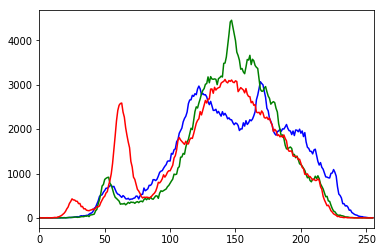

In [5]:
path_to_dataset = '../data/ukbench/ukbench'

img = imread(path_to_dataset + '00000.jpg')

color = ('b','g','r')

for i,col in enumerate(color):
    histr = cv2.calcHist([img],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

## Custom implementation

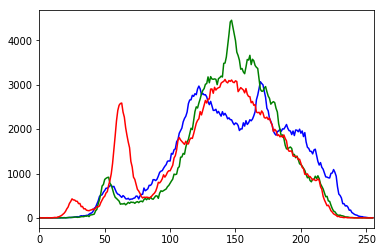

In [6]:
def calcHist(img, channel):
        pixels = img[:, :, channel]

        color_bins = np.zeros((256), dtype=np.float32)
        
        width = pixels.shape[0]
        height = pixels.shape[1]
        
        for y in range(height):
            for x in range (width):
                color_bins[pixels[x, y]]+=1

        return color_bins
            
path_to_dataset = '../data/ukbench/ukbench'

img = imread(path_to_dataset + '00000.jpg')

color = ('b','g','r')

for i,col in enumerate(color):
    histr = calcHist(img, i)
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

<b>Comments:</b> calcHist() is a simple custom implementation of color histogram. In this implementation it's not possible to set mask, bins, color_range, etc.

# Task - write a program to measure the L2 distance between color histograms of two images.

In [84]:
def l2_between_hist(img1, img2, channels):
    diffs = np.zeros(len(channels))
    for channel in channels:
        hist1 = cv2.calcHist([img1],[channel],None,[256],[0,256])
        hist2 = cv2.calcHist([img2],[channel],None,[256],[0,256])
        diffs[channel] = cv2.norm(hist1 - hist2, cv2.NORM_L2)
    return np.average(diffs)

small test

In [85]:
l2_between_hist(imread(path_to_dataset + '00000.jpg'), imread(path_to_dataset + '00000.jpg'), channels=[0,1,2])

0.0

In [86]:
l2_between_hist(imread_gray(path_to_dataset + '00000.jpg'), imread_gray(path_to_dataset + '00000.jpg'), channels=[0])

0.0

In [87]:
l2_between_hist(imread(path_to_dataset + '00000.jpg'), imread(path_to_dataset + '00001.jpg'), channels=[0,1,2])

5097.685159927499

In [88]:
l2_between_hist(imread_gray(path_to_dataset + '00000.jpg'), imread_gray(path_to_dataset + '00001.jpg'), channels=[0])

5177.945924785233

<b>Comments:</b> I used cv2.calcHist just in order to get faster calculation time.

# Task - find 10 best matches

In [190]:
# return sorted (from small to big):
# [0] - filenames (closest images)
# [1] - corresponding L2 distances
def find_best_matches(image_name, path, num_similar = 10):
    match_value = np.full(num_similar, 2**50)
    match_file = np.empty(num_similar, dtype='S100')
#     i = 0;
    for filename in (glob.glob(path + '/*.jpg')):
        # the same file
        if (filename == image_name):
            continue
#         print(filename, path + image_name)
        # calc distance
        dist = l2_between_hist(imread(path + image_name), imread(filename), channels=[0,1,2])
        # get min idx and value        
        max_idx = np.argmax(match_value)
        max_value = match_value[max_idx]
        # update array if needed         
        if max_value > dist:
            match_value[max_idx] = dist
            match_file[max_idx] = filename
        
#         if i == 100:
#             break
#         i+=1
    
    sorted_filenames = [x for _,x in sorted(zip(match_value, match_file))]
    sorted_values = np.sort(match_value)
    return (sorted_filenames, sorted_values)
        

In [197]:
path_to_dataset = '../data/ukbench/'
queue = ["ukbench00004.jpg", "ukbench00040.jpg", "ukbench00060.jpg", "ukbench00588.jpg", "ukbench01562.jpg"]

Original image: 


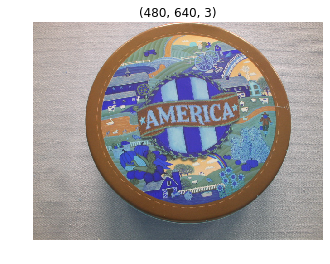

Similar image ../data/ukbench/ukbench00004.jpg  with L2 distance 0 


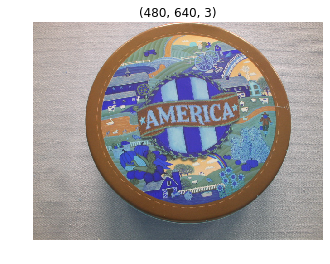

Similar image ../data/ukbench/ukbench00007.jpg  with L2 distance 6615 


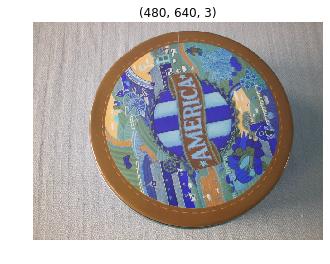

Similar image ../data/ukbench/ukbench00005.jpg  with L2 distance 7012 


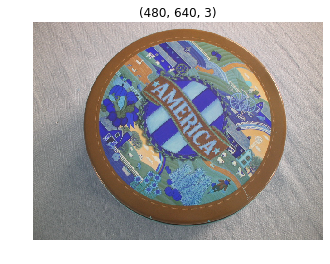

Similar image ../data/ukbench/ukbench00185.jpg  with L2 distance 8316 


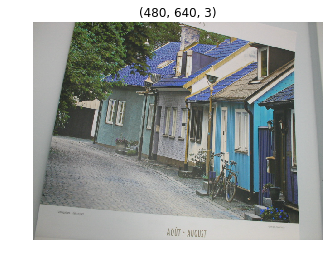

Similar image ../data/ukbench/ukbench00009.jpg  with L2 distance 8371 


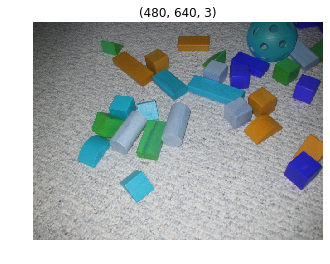

Similar image ../data/ukbench/ukbench00559.jpg  with L2 distance 8606 


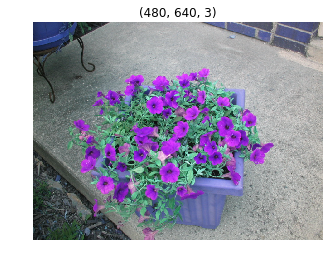

Similar image ../data/ukbench/ukbench01717.jpg  with L2 distance 9029 


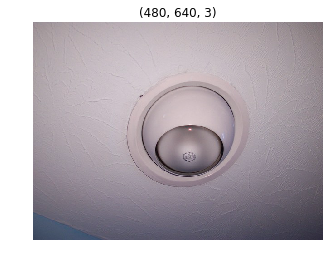

Similar image ../data/ukbench/ukbench00234.jpg  with L2 distance 9101 


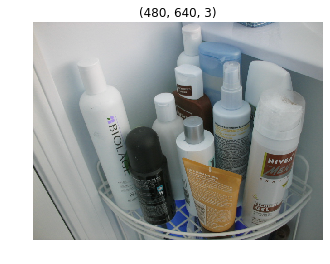

Similar image ../data/ukbench/ukbench00232.jpg  with L2 distance 9111 


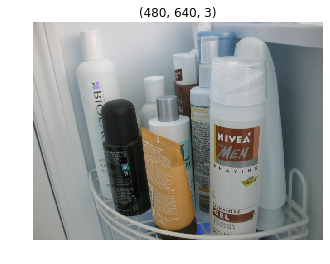

Similar image ../data/ukbench/ukbench00556.jpg  with L2 distance 9275 


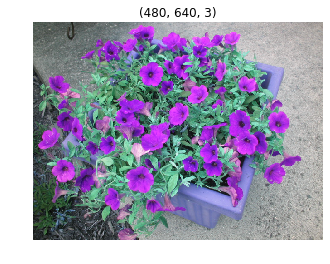

------------
Original image: 


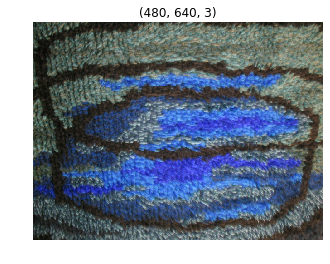

Similar image ../data/ukbench/ukbench00040.jpg  with L2 distance 0 


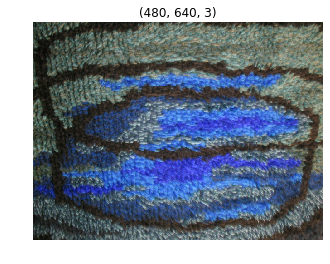

Similar image ../data/ukbench/ukbench00043.jpg  with L2 distance 3452 


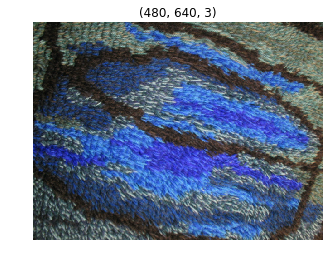

Similar image ../data/ukbench/ukbench00041.jpg  with L2 distance 4470 


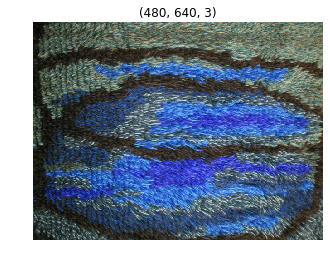

Similar image ../data/ukbench/ukbench00042.jpg  with L2 distance 4783 


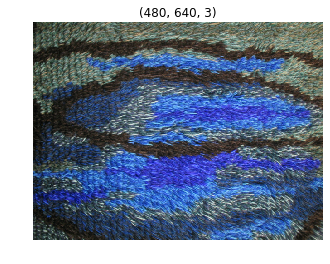

Similar image ../data/ukbench/ukbench00717.jpg  with L2 distance 9498 


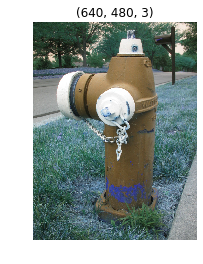

Similar image ../data/ukbench/ukbench00718.jpg  with L2 distance 9687 


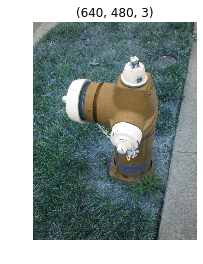

Similar image ../data/ukbench/ukbench00856.jpg  with L2 distance 9710 


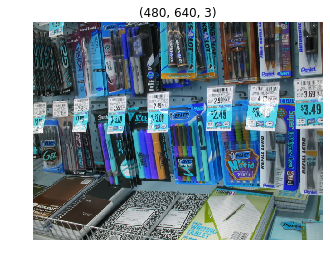

Similar image ../data/ukbench/ukbench00785.jpg  with L2 distance 9713 


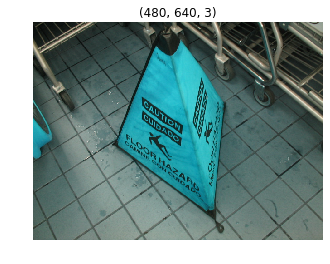

Similar image ../data/ukbench/ukbench01471.jpg  with L2 distance 9840 


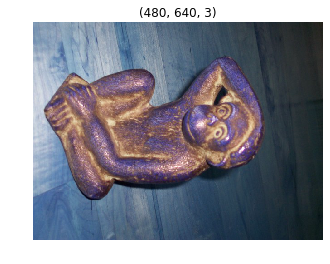

Similar image ../data/ukbench/ukbench01836.jpg  with L2 distance 9879 


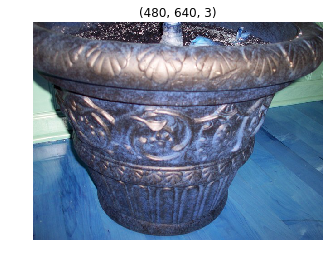

------------
Original image: 


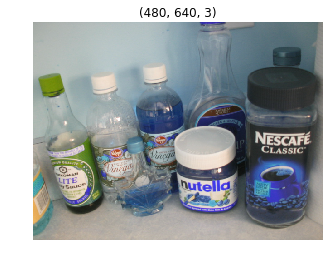

Similar image ../data/ukbench/ukbench00060.jpg  with L2 distance 0 


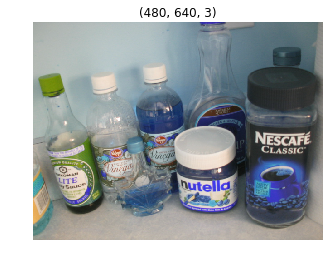

Similar image ../data/ukbench/ukbench00061.jpg  with L2 distance 5562 


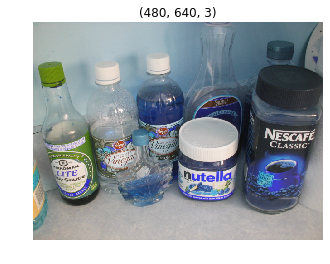

Similar image ../data/ukbench/ukbench00559.jpg  with L2 distance 6206 


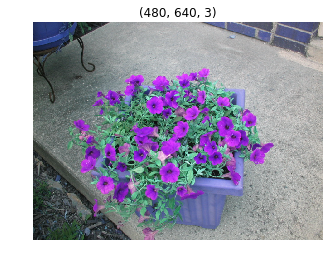

Similar image ../data/ukbench/ukbench00185.jpg  with L2 distance 7795 


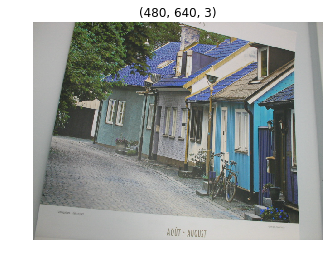

Similar image ../data/ukbench/ukbench00820.jpg  with L2 distance 7878 


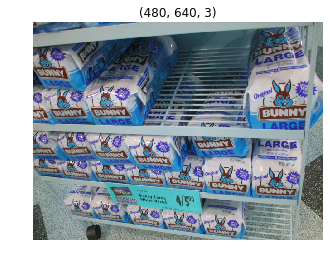

Similar image ../data/ukbench/ukbench00821.jpg  with L2 distance 7914 


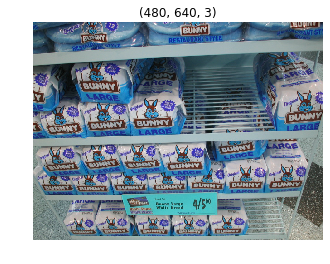

Similar image ../data/ukbench/ukbench00556.jpg  with L2 distance 8140 


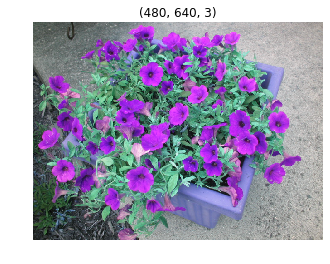

Similar image ../data/ukbench/ukbench00557.jpg  with L2 distance 8552 


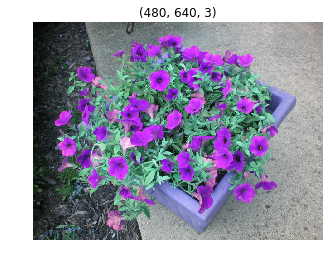

Similar image ../data/ukbench/ukbench00887.jpg  with L2 distance 8755 


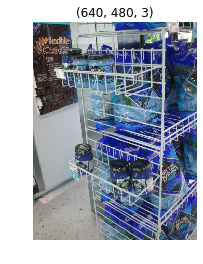

Similar image ../data/ukbench/ukbench00896.jpg  with L2 distance 8898 


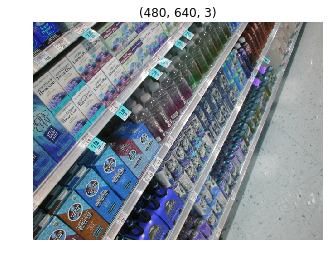

------------
Original image: 


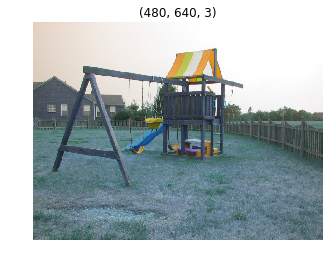

Similar image ../data/ukbench/ukbench00588.jpg  with L2 distance 0 


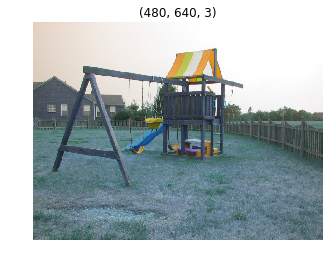

Similar image ../data/ukbench/ukbench00589.jpg  with L2 distance 15511 


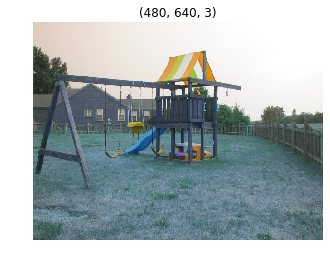

Similar image ../data/ukbench/ukbench00668.jpg  with L2 distance 16763 


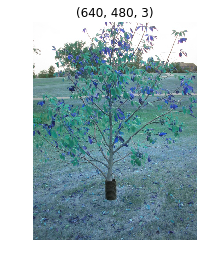

Similar image ../data/ukbench/ukbench00650.jpg  with L2 distance 17389 


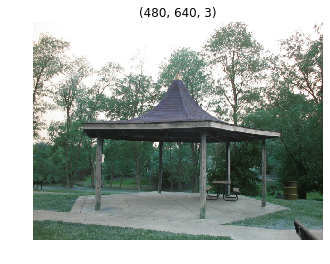

Similar image ../data/ukbench/ukbench00566.jpg  with L2 distance 17813 


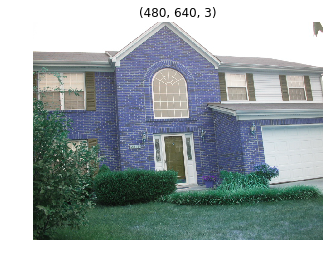

Similar image ../data/ukbench/ukbench01844.jpg  with L2 distance 18610 


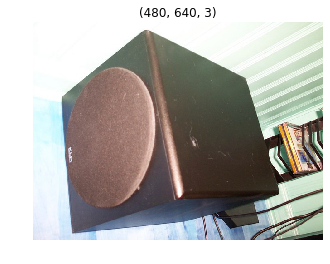

Similar image ../data/ukbench/ukbench00565.jpg  with L2 distance 18615 


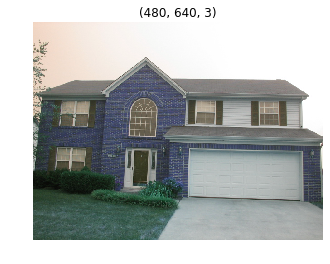

Similar image ../data/ukbench/ukbench00651.jpg  with L2 distance 18898 


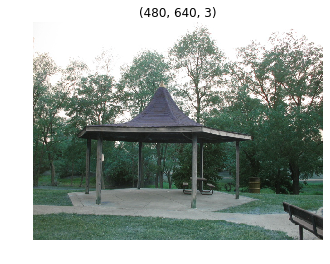

Similar image ../data/ukbench/ukbench00649.jpg  with L2 distance 19283 


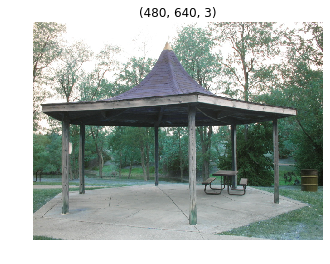

Similar image ../data/ukbench/ukbench01810.jpg  with L2 distance 20035 


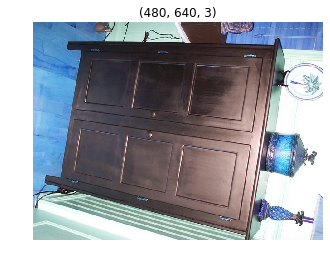

------------
Original image: 


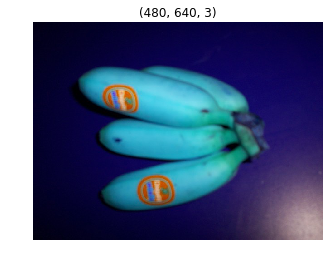

Similar image ../data/ukbench/ukbench01562.jpg  with L2 distance 0 


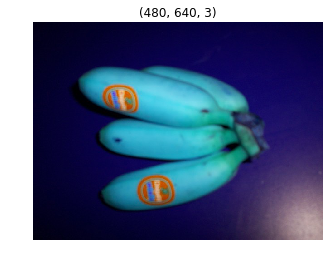

Similar image ../data/ukbench/ukbench01646.jpg  with L2 distance 12293 


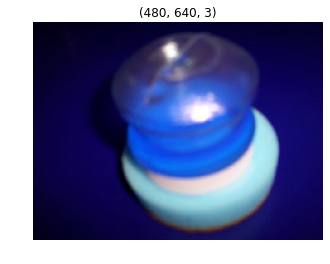

Similar image ../data/ukbench/ukbench01589.jpg  with L2 distance 12529 


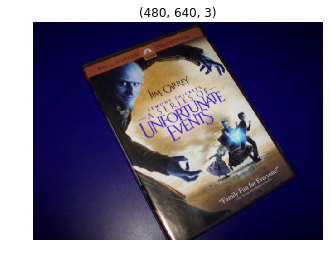

Similar image ../data/ukbench/ukbench01686.jpg  with L2 distance 13139 


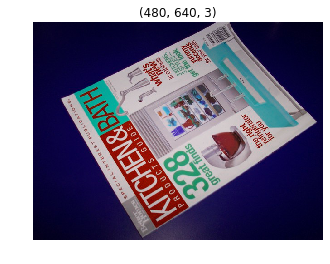

Similar image ../data/ukbench/ukbench01722.jpg  with L2 distance 13548 


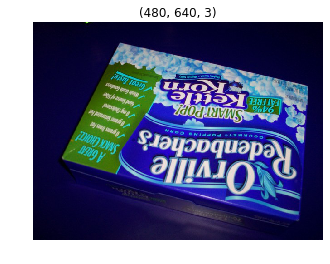

Similar image ../data/ukbench/ukbench01613.jpg  with L2 distance 13689 


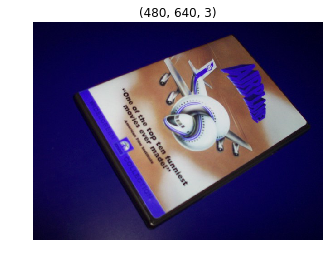

Similar image ../data/ukbench/ukbench01627.jpg  with L2 distance 14153 


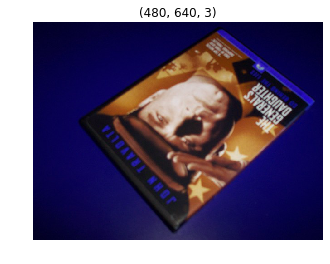

Similar image ../data/ukbench/ukbench01594.jpg  with L2 distance 14997 


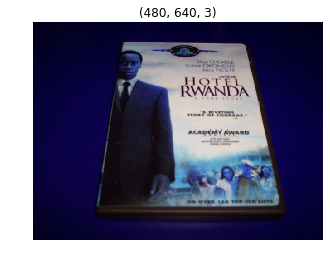

Similar image ../data/ukbench/ukbench01685.jpg  with L2 distance 15924 


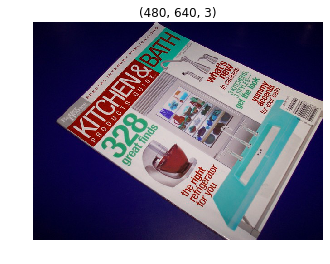

Similar image ../data/ukbench/ukbench01625.jpg  with L2 distance 15958 


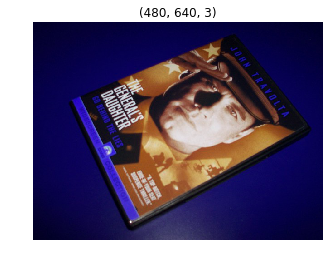

------------


In [198]:
for img in queue:
    results = find_best_matches(img, path_to_dataset)
    print("Original image: ")
    imshow(imread(path_to_dataset + img))
    plt.show()
    for i in range(len(results[0])):
        print("Similar image %s  with L2 distance %d " % (results[0][i].decode('UTF-8'), results[1][i]) )
        imshow(imread(results[0][i].decode('UTF-8')))
        plt.show()
    print("------------")